In [12]:
import numpy as np 
import pandas as pd 
import os
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import tensorflow
import tensorflow as tf
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
from tensorflow import keras
from keras import callbacks
from tensorflow.keras import layers, Sequential, callbacks
from tensorflow.keras.layers import Conv2D, Flatten, Reshape, Dense, Dropout, Bidirectional, Conv1D, MaxPooling1D
from tensorflow.keras.optimizers import SGD, Adam
import math
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers.schedules import ExponentialDecay
import warnings
warnings.filterwarnings("ignore")

In [2]:
data_2023 = pd.read_csv("./data/processed_data_2023.csv", index_col=0)

data_2023['timestamp'] = pd.to_datetime(data_2023['timestamp'])
data_2023['month'] = data_2023['timestamp'].dt.month
data_2023['day'] = data_2023['timestamp'].dt.day
data_2023['hour'] = data_2023['timestamp'].dt.hour
data_2023['minute'] = data_2023['timestamp'].dt.minute
data_2023['weekday'] = data_2023['timestamp'].dt.strftime('%A')

weekday_mapping = {
    'Monday': 0,
    'Tuesday': 1,
    'Wednesday': 2,
    'Thursday': 3,
    'Friday': 4,
    'Saturday': 5,
    'Sunday': 6
}

data_2023['weekday'] = data_2023['weekday'].map(weekday_mapping)


# we use cycle encoding to preserve the cycle nature of weekdays
data_2023['weekday_sin'] = np.sin(2 * np.pi * data_2023['weekday'] / 7)
data_2023['weekday_cos'] = np.cos(2 * np.pi * data_2023['weekday'] / 7)

print("shape : ",data_2023.shape)
data_2023.head()

shape :  (746917, 13)


,timestamp,image,camera_id,location.latitude,location.longitude,vehicle_count,month,day,hour,minute,weekday,weekday_sin,weekday_cos
0,2022-12-31 23:56:50+08:00,https://images.data.gov.sg/api/traffic-images/...,1001,1.295313,103.871146,0.0,12,31,23,56,5,-0.974928,-0.222521
1,2022-12-31 23:56:50+08:00,https://images.data.gov.sg/api/traffic-images/...,1002,1.319541,103.878563,1.0,12,31,23,56,5,-0.974928,-0.222521
2,2022-12-31 23:56:50+08:00,https://images.data.gov.sg/api/traffic-images/...,1003,1.323957,103.872858,2.0,12,31,23,56,5,-0.974928,-0.222521
3,2022-12-31 23:56:50+08:00,https://images.data.gov.sg/api/traffic-images/...,1004,1.319536,103.875067,1.0,12,31,23,56,5,-0.974928,-0.222521
4,2022-12-31 23:56:50+08:00,https://images.data.gov.sg/api/traffic-images/...,1005,1.363520,103.905394,1.0,12,31,23,56,5,-0.974928,-0.222521


In [3]:
from keras.layers import Input, Embedding, Flatten, Concatenate, Dense, Dropout, BatchNormalization
from keras.models import Model
from keras import callbacks
from keras.regularizers import l2

def leaky_relu(x):
    return tf.nn.leaky_relu(x, alpha=0.01)


def MLP_model_2(X_Train, y_Train, X_Test, y_Test):
    early_stopping = callbacks.EarlyStopping(min_delta=0.001, patience=10, restore_best_weights=True) 
    
    # Define input for other features (excluding camera_id)
    model = Sequential()
    model.add(Dense(128, activation=leaky_relu, kernel_regularizer=l2(0.01), input_dim=X_Train.shape[1]-1))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu', kernel_regularizer=l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(16, activation=leaky_relu))
    model.add(Dropout(0.2))
    model.add(Dense(units=1))
    
    optimizer = Adam(clipnorm=0.01) 
    model.compile(optimizer=optimizer, loss='mean_squared_error')
    
    X_Train.drop(columns=['camera_id'], inplace=True)
    X_Test.drop(columns=['camera_id'], inplace=True)
    
    # Train the model
    history = model.fit(X_Train, y_Train,
                        validation_data=(X_Test, y_Test),
                        epochs=100, batch_size=120,
                        callbacks=[early_stopping])

    # Predictions
    pred_MLP = model.predict(X_Test)

    return pred_MLP, history, model
    

#To plot the comparitive plot of targets and predictions
def PredictionsPlot(x_test, y_test, predicted):
    df_y_test = pd.DataFrame({'y_test': y_test}).reset_index(drop=True)

    timestamps = data_2023.loc[x_test.index, 'timestamp']
    predicted_flat = predicted.flatten()
    df = pd.DataFrame({'predicted': predicted_flat})

    # Add camera_id to the DataFrame
    df = pd.concat([df, x_test.set_axis(df.index)], axis=1).reset_index(drop=True)
    df_y_test = pd.concat([df_y_test, x_test.set_axis(df_y_test.index)], axis=1).reset_index(drop=True)

    # Add timestamp to the Dataframe
    df = pd.concat([df, timestamps.set_axis(df.index)], axis=1).reset_index(drop=True)
    df_y_test = pd.concat([df_y_test, timestamps.set_axis(df_y_test.index)], axis=1).reset_index(drop=True)

    unique_camera_ids = df_y_test['camera_id'].unique()
    num_subplots = len(unique_camera_ids)
    num_rows = (num_subplots - 1) // 3 + 1 

    fig, axes = plt.subplots(num_rows, 3, figsize=(18, 5 * num_rows), facecolor="#99ccff", sharex=True)

    for i, camera_id in enumerate(unique_camera_ids):
        row = i // 3 
        col = i % 3  
        ax = axes[row, col] if num_rows > 1 else axes[col]  # Access the correct subplot
        
        camera_df_y_test = df_y_test[df_y_test['camera_id'] == camera_id]
        camera_df = df[df['camera_id'] == camera_id]
        ax.plot(camera_df_y_test['timestamp'].values, camera_df_y_test['y_test'].values, label=f'True Value (Camera ID: {camera_id})',
                color='red', alpha=0.5, linewidth=2)
        ax.plot(camera_df['timestamp'].values, camera_df['predicted'].values, label=f'Predicted Value (Camera ID: {camera_id})',
                color='blue', linestyle='--', alpha=0.8, linewidth=1)
        ax.set_title(f"Camera ID: {camera_id}")
        ax.set_ylabel("Number of Vehicles")
        ax.legend()

    plt.xlabel("DateTime")
    plt.tight_layout()
    plt.show()
    
    
def train_models_for_each_camera(X_train, y_train, X_test, y_test, camera_id_types):
    models = {}
    histories = {}  # Dictionary to store training histories for each model
    
    for camera_id in camera_id_types:
        # Filter training data for the current camera ID
        X_train_camera = X_train[X_train['camera_id'] == camera_id].copy()
        y_train_camera = y_train[X_train['camera_id'] == camera_id].copy()
        X_test_camera = X_test[X_test['camera_id'] == camera_id].copy()
        y_test_camera = y_test[X_test['camera_id'] == camera_id].copy()
        
        
        # Train a model for the current camera ID
        _, history, model = MLP_model_2(X_train_camera, y_train_camera, X_test_camera, y_test_camera)
        
        # Store the model in the dictionary
        models[camera_id] = model
        
        # Store the training history
        histories[camera_id] = history
        
        # Print final training and validation loss for the current model
        print(f"Camera ID: {camera_id}, Final Training Loss: {history.history['loss'][-1]}, Final Validation Loss: {history.history['val_loss'][-1]}")
        
    return models, histories

In [4]:
from sklearn.model_selection import train_test_split

# # Define features and target variable
X = data_2023[['camera_id', 'month', 'day', 'hour', 'weekday_sin', 'weekday_cos']]
y = data_2023['vehicle_count']

camera_id_types = X['camera_id'].unique()

# # Split the data into training and testing sets (e.g., 80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
numerical_features = ['month', 'day', 'hour', 'weekday_sin', 'weekday_cos']
scaler = MinMaxScaler()
X_train[numerical_features] = scaler.fit_transform(X_train[numerical_features])
X_test[numerical_features] = scaler.transform(X_test[numerical_features])


In [5]:
models, histories = train_models_for_each_camera(X_train, y_train, X_test, y_test, camera_id_types)


Epoch 1/100


2024-03-22 23:33:56.506773: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-22 23:33:56.509042: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-22 23:33:57.134137: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required l

55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 1.1791 - val_loss: 1.0364
Epoch 2/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9112 - val_loss: 0.9229
Epoch 3/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8068 - val_loss: 0.8398
Epoch 4/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7198 - val_loss: 0.7707
Epoch 5/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7523 - val_loss: 0.7277
Epoch 6/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6524 - val_loss: 0.7025
Epoch 7/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6680 - val_loss: 0.6678
Epoch 8/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6450 - val_loss: 0.6521
Epoch 9/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5553 - val_loss: 0.6156
Epoch 10/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5681 - val_loss: 0.6261
Epoch 11/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5253 - val_loss: 0.6006
Epoch 12/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5635 - val_lo

Visualizing the predictive capabilities of the model

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 574us/step
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 591us/step
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 596us/step
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 583us/step
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 579us/step
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 566us/step
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 578us/step
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 571us/step
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 577us/step
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 580us/step
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 583us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 566us/step
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 576us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 582us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 579us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 574us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 572us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 568us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 571us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 581us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 581us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 592us/step
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 562us/step
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 566us/step
53/53 ━━━━━━━━━━

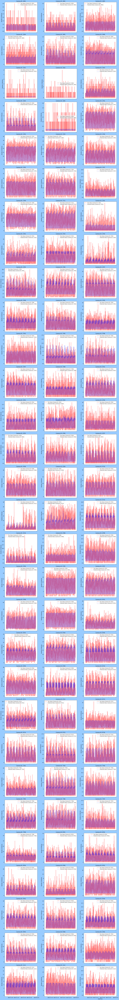

In [7]:
split_index = int(len(data_2023) * 0.8)

X_later_20 = X.iloc[split_index:]
timestamps = data_2023["timestamp"].iloc[split_index:]
y_later_20 = y.iloc[split_index:]
X_later_20[numerical_features] = scaler.transform(X_later_20[numerical_features])


num_subplots = len(camera_id_types)
num_rows = (num_subplots - 1) // 3 + 1 
fig, axes = plt.subplots(num_rows, 3, figsize=(18, 5 * num_rows), facecolor="#99ccff", sharex=True)

for i, camera_id in enumerate(camera_id_types):
    X_camera = X_later_20[X_later_20['camera_id'] == camera_id].copy()
    X_camera.drop(columns=['camera_id'], inplace=True)
    y_camera = y_later_20[X_later_20['camera_id'] == camera_id].copy()
    camera_timestamps = timestamps[X_later_20['camera_id'] == camera_id].copy()
    
    # predict
    pred_MLP = models[camera_id].predict(X_camera)
    
    df_y_test = pd.DataFrame({'y_camera': y_camera}).reset_index(drop=True)
    predicted_flat = pred_MLP.flatten()
    df = pd.DataFrame({'predicted': predicted_flat})

    # Add timestamp to the Dataframe
    df = pd.concat([df, camera_timestamps.reset_index(drop=True)], axis=1).reset_index(drop=True)
    df_y_test = pd.concat([df_y_test, camera_timestamps.reset_index(drop=True)], axis=1).reset_index(drop=True)
    
    row = i // 3 
    col = i % 3  
    ax = axes[row, col] if num_rows > 1 else axes[col]  # Access the correct subplot
    
    ax.plot(df_y_test['timestamp'].values, df_y_test['y_camera'].values, label=f'True Value (Camera ID: {camera_id})',
            color='red', alpha=0.5, linewidth=2)
    ax.plot(df['timestamp'].values, df['predicted'].values, label=f'Predicted Value (Camera ID: {camera_id})',
            color='blue', linestyle='--', alpha=0.8, linewidth=1)
    ax.set_title(f"Camera ID: {camera_id}")
    ax.set_ylabel("Number of Vehicles")
    ax.legend()

plt.xlabel("DateTime")
plt.tight_layout()
plt.show()

I'll say the predictions are pretty decent and seems the capture the traffic volume distribution pattern. We could have definitely done better if we use sequence modelling models such as LSTM/GRU, because they are better at capturning time-series distributions

### Saving the model
Save each individual model for each camera_id and also the scaler for the inputs

In [ ]:
from joblib import dump

for camera_id, model in models.items():
    model.save(f"models/camera_{camera_id}_model.h5")

dump(scaler, 'traffic_scaler.joblib')

### Forecasting comparison against live data
Let's see how well our model does when trying to forecast traffic in 2024!

In [90]:
import pickle
import pandas as pd
import numpy as np
from keras.models import load_model
from joblib import load
from datetime import datetime, timedelta

numerical_features = ['month', 'day', 'hour', 'weekday_sin', 'weekday_cos']

def predict_single_instance(camera_id, datetime_value):
    # Load the model and scaler
    model = load_model(f"models/camera_{camera_id}_model.h5")
    scaler = load('traffic_scaler.joblib')
    
    weekday_mapping = {
        'Monday': 0,
        'Tuesday': 1,
        'Wednesday': 2,
        'Thursday': 3,
        'Friday': 4,
        'Saturday': 5,
        'Sunday': 6
    }
    
    month = datetime_value.month
    day = datetime_value.day
    hour = datetime_value.hour
    weekday = datetime_value.weekday()
    weekday_sin = np.sin(2 * np.pi * weekday / 7)
    weekday_cos = np.cos(2 * np.pi * weekday / 7)
    
    data_instance = pd.DataFrame({
        'month': [month],
        'day': [day],
        'hour': [hour],
        'weekday_sin': [weekday_sin],
        'weekday_cos': [weekday_cos]
    })
    data_instance = scaler.transform(data_instance)
    
    # Make predictions
    prediction = model.predict(data_instance)
    
    return prediction

def predict_X_hours(camera_id, datetime_value, num_hours):
    # Load the model and scaler
    model = load_model(f"models/camera_{camera_id}_model.h5")
    scaler = load('traffic_scaler.joblib')
    
    weekday_mapping = {
        'Monday': 0,
        'Tuesday': 1,
        'Wednesday': 2,
        'Thursday': 3,
        'Friday': 4,
        'Saturday': 5,
        'Sunday': 6
    }
    
    data_instances = []  # List to store multiple data instances
    
    # Add data instances for the next three hours
    for i in range(num_hours):  # Including the current time
        # Update the hour and day if it crosses into a new day
        datetime_value = datetime_value + timedelta(hours=i)
        month = datetime_value.month
        day = datetime_value.day
        weekday = datetime_value.weekday()
        hour = datetime_value.hour
        weekday_sin = np.sin(2 * np.pi * weekday / 7)
        weekday_cos = np.cos(2 * np.pi * weekday / 7)
            
        # Create a new data instance for this hour
        data_instance = {
            'month': month,
            'day': day,
            'hour': hour,
            'weekday_sin': weekday_sin,
            'weekday_cos': weekday_cos
        }
        
        data_instances.append(data_instance)
    
    # Convert list of dictionaries to DataFrame
    data_instance_df = pd.DataFrame(data_instances)
    
    # Normalize numerical features
    data_instance_df = scaler.transform(data_instance_df)
    
    # Make predictions for each data instance
    predictions = model.predict(data_instance_df)
    
    return predictions

In [94]:
import requests

url = "https://api.data.gov.sg/v1/transport/traffic-images"

# Get the current date and time
current_time = datetime.now()

# Format the current time as required by the API
current_time_str = current_time.strftime("%Y-%m-%dT%H:%M:%S")

# Set the parameters for the API request
params = {
    "date_time": current_time_str
}

# Make the API request
response = requests.get(url, params=params)

current_df_json=response.json()
current_df=pd.json_normalize(current_df_json,record_path =['items','cameras'])

In [100]:
from IPython.display import display, Image

for id in ['1709', '3705', '9704']:
    display(Image(url=current_df.loc[current_df['camera_id'] == id]['image'].values[0]))
    print("Predicted number of cars: ", predict_single_instance(id, current_time)[0][0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Predicted number of cars:  5.5381613


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Predicted number of cars:  0.49923825


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Predicted number of cars:  1.07223


Looks like our model is not that bad at forecasting traffic in 2024!